# Introduction à SPARK MLIB
MLlib est la bibliothèque d’apprentissage automatique de Spark, 

Elle fournit de nombreux algorithmes de ML distribués que couvrent different tâches telles que :
  1. l’extraction d’entités, 
  2. la classification, 
  3. la régression,
  4. le clustering, 
  5. la recommandation.

md
  MLlib fournit également des outils pour simplifier l'analyse et évaluations des modedels tels que :   
  1. ML Pipelines pour créer des workflows. 
  2. CrossValidator pour régler les paramètres. 
  3. La persistance du modèle pour enregistrer et charger les modèles.
  
  [Documentation MLIB](https://spark.apache.org/mllib/)

Ce notebook est conçu pour vous aider à démarrer avec Apache Spark MLlib.

**Objectif :** Nous allons étudier un problème de classification binaire:
**Prédire si le revenu d'un individu est supérieur à 50 000 $** à partir d'une base de données démographiques

L'ensemble de données provient du [UCI Machine Learning Repository](https://archive.ics.uci.edu/ml/datasets/Adult) et est fourni avec Databricks Runtime. 

Ce notebook présente certaines des fonctionnalités disponibles dans MLlib: notamment des outils de prétraitement des données, des pipelines d'apprentissage automatique et plusieurs algorithmes d'apprentissage automatique.

<b>Ce cahier comprend les étapes suivantes:</b> 

0. Charger le jeu de données
0. Nettoayage des données
0. Définir le modèle
0. Construisez le pipeline
0. Évaluer le modèle
0. Réglage des hyperparamètres
0. Faire des prédictions et évaluer les performances du modèle

# Étape 0. Chargez l'ensemble de données

Afficher les premières lignes des données et créer un schéma pour attribuer des noms de colonne et des types de données.

In [0]:
schema = """`age` DOUBLE,
`workclass` STRING,
`fnlwgt` DOUBLE,
`education` STRING,
`education_num` DOUBLE,
`marital_status` STRING,
`occupation` STRING,
`relationship` STRING,
`race` STRING,
`sex` STRING,
`capital_gain` DOUBLE,
`capital_loss` DOUBLE,
`hours_per_week` DOUBLE,
`native_country` STRING,
`income` STRING"""

dataset = spark.read.csv("/databricks-datasets/adult/adult.data", schema=schema)

#dataset = spark.read.csv("/databricks-datasets/adult/adult.data", header=True, inferSchema=True)
dataset.show()
print(dataset.count())

+----+-----------------+--------+-------------+-------------+--------------------+------------------+--------------+-------------------+-------+------------+------------+--------------+--------------+------+
| age|        workclass|  fnlwgt|    education|education_num|      marital_status|        occupation|  relationship|               race|    sex|capital_gain|capital_loss|hours_per_week|native_country|income|
+----+-----------------+--------+-------------+-------------+--------------------+------------------+--------------+-------------------+-------+------------+------------+--------------+--------------+------+
|39.0|        State-gov| 77516.0|    Bachelors|         13.0|       Never-married|      Adm-clerical| Not-in-family|              White|   Male|      2174.0|         0.0|          40.0| United-States| <=50K|
|50.0| Self-emp-not-inc| 83311.0|    Bachelors|         13.0|  Married-civ-spouse|   Exec-managerial|       Husband|              White|   Male|         0.0|         0.

In [0]:
display(dataset)

age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income
39.0,State-gov,77516.0,Bachelors,13.0,Never-married,Adm-clerical,Not-in-family,White,Male,2174.0,0.0,40.0,United-States,<=50K
50.0,Self-emp-not-inc,83311.0,Bachelors,13.0,Married-civ-spouse,Exec-managerial,Husband,White,Male,0.0,0.0,13.0,United-States,<=50K
38.0,Private,215646.0,HS-grad,9.0,Divorced,Handlers-cleaners,Not-in-family,White,Male,0.0,0.0,40.0,United-States,<=50K
53.0,Private,234721.0,11th,7.0,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0.0,0.0,40.0,United-States,<=50K
28.0,Private,338409.0,Bachelors,13.0,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0.0,0.0,40.0,Cuba,<=50K
37.0,Private,284582.0,Masters,14.0,Married-civ-spouse,Exec-managerial,Wife,White,Female,0.0,0.0,40.0,United-States,<=50K
49.0,Private,160187.0,9th,5.0,Married-spouse-absent,Other-service,Not-in-family,Black,Female,0.0,0.0,16.0,Jamaica,<=50K
52.0,Self-emp-not-inc,209642.0,HS-grad,9.0,Married-civ-spouse,Exec-managerial,Husband,White,Male,0.0,0.0,45.0,United-States,>50K
31.0,Private,45781.0,Masters,14.0,Never-married,Prof-specialty,Not-in-family,White,Female,14084.0,0.0,50.0,United-States,>50K
42.0,Private,159449.0,Bachelors,13.0,Married-civ-spouse,Exec-managerial,Husband,White,Male,5178.0,0.0,40.0,United-States,>50K


In [0]:
display(dataset)

age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income
39.0,State-gov,77516.0,Bachelors,13.0,Never-married,Adm-clerical,Not-in-family,White,Male,2174.0,0.0,40.0,United-States,<=50K
50.0,Self-emp-not-inc,83311.0,Bachelors,13.0,Married-civ-spouse,Exec-managerial,Husband,White,Male,0.0,0.0,13.0,United-States,<=50K
38.0,Private,215646.0,HS-grad,9.0,Divorced,Handlers-cleaners,Not-in-family,White,Male,0.0,0.0,40.0,United-States,<=50K
53.0,Private,234721.0,11th,7.0,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0.0,0.0,40.0,United-States,<=50K
28.0,Private,338409.0,Bachelors,13.0,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0.0,0.0,40.0,Cuba,<=50K
37.0,Private,284582.0,Masters,14.0,Married-civ-spouse,Exec-managerial,Wife,White,Female,0.0,0.0,40.0,United-States,<=50K
49.0,Private,160187.0,9th,5.0,Married-spouse-absent,Other-service,Not-in-family,Black,Female,0.0,0.0,16.0,Jamaica,<=50K
52.0,Self-emp-not-inc,209642.0,HS-grad,9.0,Married-civ-spouse,Exec-managerial,Husband,White,Male,0.0,0.0,45.0,United-States,>50K
31.0,Private,45781.0,Masters,14.0,Never-married,Prof-specialty,Not-in-family,White,Female,14084.0,0.0,50.0,United-States,>50K
42.0,Private,159449.0,Bachelors,13.0,Married-civ-spouse,Exec-managerial,Husband,White,Male,5178.0,0.0,40.0,United-States,>50K


# Visualiser les données

In [0]:
display(dataset.select("hours_per_week").summary())

summary,hours_per_week
count,32561
mean,40.437455852092995
stddev,12.347428681731838
min,1.0
25%,40.0
50%,40.0
75%,45.0
max,99.0


In [0]:
display(dataset.select("hours_per_week").summary())

summary,hours_per_week
count,32561
mean,40.437455852092995
stddev,12.347428681731838
min,1.0
25%,40.0
50%,40.0
75%,45.0
max,99.0


In [0]:
display(dataset.select("hours_per_week"))

hours_per_week
40.0
13.0
40.0
40.0
40.0
40.0
16.0
45.0
50.0
40.0


In [0]:
display(dataset.select("age").summary())


summary,age
count,32561
mean,38.58164675532078
stddev,13.640432553581356
min,17.0
25%,28.0
50%,37.0
75%,48.0
max,90.0


In [0]:
display(dataset.filter(dataset.education_num== 13) \
    .sort("age") \
    .groupBy("marital_status")\
    .count())
    

marital_status,count
Widowed,82
Married-spouse-absent,68
Married-AF-spouse,4
Married-civ-spouse,2768
Divorced,546
Never-married,1795
Separated,92


In [0]:
display(dataset.groupBy("marital_status")\
    .count())

marital_status,count
Widowed,993
Married-spouse-absent,418
Married-AF-spouse,23
Married-civ-spouse,14976
Divorced,4443
Never-married,10683
Separated,1025


In [0]:
display(dataset.groupBy("education")\
    .count())

education,count
Prof-school,576
10th,933
7th-8th,646
5th-6th,333
Assoc-acdm,1067
Assoc-voc,1382
Masters,1723
12th,433
Preschool,51
9th,514


In [0]:
display(dataset.filter(dataset.education_num == 13.0) \
    .groupBy("age")\
    .count()\
    .sort("age"))

age,count
19.0,2
20.0,1
21.0,7
22.0,85
23.0,186
24.0,195
25.0,205
26.0,192
27.0,192
28.0,178


# Transformers, estimators, and pipelines

-**Estimator:** **apprend** (ou «ajuste») les paramètres de votre DataFrame via une méthode '.fit ()' et renvoie un modèle, qui est un transformateur.

-**Transformer:** prend un DataFrame comme entrée et renvoie un nouveau DataFrame. Les transformateurs n'apprennent aucun paramètre à partir des données. Ils appliquent simplement des transformations basées sur des règles pour **préparer les données** pour l'apprentissage du modèle **ou générer des prédictions à l'aide d'un modèle MLlib entraîné **. On appele un transformateur avec une méthode '.transform ()'.

-**Pipeline:** combine plusieurs étapes dans un flux de travail unique qui peut être facilement exécuté. La création d'un modèle d'apprentissage automatique implique généralement la configuration de nombreuses étapes différentes et leur itération. Les pipelines vous aident à automatiser ce processus.

**Comment ça fonctionne?**
Un pipeline est spécifié comme une séquence d'étapes et **chaque étape est soit un transformateur, soit un estimateur**. Ces étapes sont exécutées dans l'ordre et le DataFrame d'entrée est transformé à mesure qu'il traverse chaque étape. Pour les étapes Transformer, la méthode transform () est appelée sur le DataFrame. Pour les étapes Estimator, la méthode fit () est appelée pour produire un Transformer (qui devient une partie du PipelineModel, ou Pipeline ajusté), et la méthode transform () de Transformer est appelée sur le DataFrame.

# Étape 1. Preparation des données
On veut construire un modèle qui prédit le niveau de revenu à partir des caractéristiques incluses dans l'ensemble de données (niveau d'éducation, état matrimonial, profession, etc.). La première étape consiste à manipuler ou prétraiter les données afin qu'elles soient au format requis par MLlib.

## Convertir les variables catégorielles en variables numériques

Certains algorithmes d'apprentissage automatique, tels que la régression linéaire et logistique, nécessitent des variables numériques. L'ensemble de données Adultes comprend des caractéristiques catégoriques telles que l'éducation, la profession et l'état matrimonial.

Le bloc de code suivant illustre comment utiliser `StringIndexer` et` OneHotEncoder` pour convertir des variables catégorielles en un ensemble de variables numériques qui ne prennent que les valeurs 0 et 1.

- `StringIndexer` convertit une colonne de valeurs strings en une colonne d'index d'étiquette. Par exemple, il peut convertir les valeurs «rouge», «bleu» et «vert» en 0, 1 et 2.
- `OneHotEncoder` mappe une colonne d'indices de catégorie à une colonne de vecteurs binaires, avec au plus un" 1 "dans chaque ligne qui indique l'index de catégorie pour cette ligne.

L'encodage One-hot dans Spark est un processus en deux étapes. Vous utilisez d'abord le StringIndexer, suivi de OneHotEncoder. Le bloc de code suivant définit le StringIndexer et OneHotEncoder mais ne l'applique pas encore à des données.

[StringIndexer](http://spark.apache.org/docs/latest/ml-features.html#stringindexer)   
[OneHotEncoder](https://spark.apache.org/docs/latest/ml-features.html#onehotencoder)

In [0]:
from pyspark.ml.feature import StringIndexer, OneHotEncoder

categoricalCols = ["workclass", "education", "marital_status", "occupation", "relationship", "race", "sex"]

# The following two lines are estimators. They return functions that we will later apply to transform the dataset.
stringIndexer = StringIndexer(inputCols=categoricalCols, outputCols=[x + "Index" for x in categoricalCols]) 
encoder = OneHotEncoder(inputCols=stringIndexer.getOutputCols(), outputCols=[x + "OHE" for x in categoricalCols]) 

# The label column ("income") is also a string value - it has two possible values, "<=50K" and ">50K". 
# Convert it to a numeric value using StringIndexer.
labelToIndex = StringIndexer(inputCol="income", outputCol="label")

Nous allons créer un pipeline combinant toutes nos étapes de nettoayage et apprentisage. Mais prenons une minute pour examiner de plus près le fonctionnement des estimateurs et des transformateurs en appliquant l'estimateur `stringIndexer` que nous avons créé dans le bloc de code précédent.

Vous pouvez appeler la méthode `.fit ()` pour renvoyer un `StringIndexerModel`, que vous pouvez ensuite utiliser pour transformer l'ensemble de données.

La méthode `.transform ()` de `StringIndexerModel` renvoie un nouveau DataFrame avec les nouvelles colonnes ajoutées. Faites défiler vers la droite pour voir les nouvelles colonnes si nécessaire.

Pour plus d'informations: [StringIndexerModel]

In [0]:
stringIndexerModel = stringIndexer.fit(dataset)
display(stringIndexerModel.transform(dataset))

age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income,workclassIndex,educationIndex,marital_statusIndex,occupationIndex,relationshipIndex,raceIndex,sexIndex
39.0,State-gov,77516.0,Bachelors,13.0,Never-married,Adm-clerical,Not-in-family,White,Male,2174.0,0.0,40.0,United-States,<=50K,4.0,2.0,1.0,3.0,1.0,0.0,0.0
50.0,Self-emp-not-inc,83311.0,Bachelors,13.0,Married-civ-spouse,Exec-managerial,Husband,White,Male,0.0,0.0,13.0,United-States,<=50K,1.0,2.0,0.0,2.0,0.0,0.0,0.0
38.0,Private,215646.0,HS-grad,9.0,Divorced,Handlers-cleaners,Not-in-family,White,Male,0.0,0.0,40.0,United-States,<=50K,0.0,0.0,2.0,9.0,1.0,0.0,0.0
53.0,Private,234721.0,11th,7.0,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0.0,0.0,40.0,United-States,<=50K,0.0,5.0,0.0,9.0,0.0,1.0,0.0
28.0,Private,338409.0,Bachelors,13.0,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0.0,0.0,40.0,Cuba,<=50K,0.0,2.0,0.0,0.0,4.0,1.0,1.0
37.0,Private,284582.0,Masters,14.0,Married-civ-spouse,Exec-managerial,Wife,White,Female,0.0,0.0,40.0,United-States,<=50K,0.0,3.0,0.0,2.0,4.0,0.0,1.0
49.0,Private,160187.0,9th,5.0,Married-spouse-absent,Other-service,Not-in-family,Black,Female,0.0,0.0,16.0,Jamaica,<=50K,0.0,10.0,5.0,5.0,1.0,1.0,1.0
52.0,Self-emp-not-inc,209642.0,HS-grad,9.0,Married-civ-spouse,Exec-managerial,Husband,White,Male,0.0,0.0,45.0,United-States,>50K,1.0,0.0,0.0,2.0,0.0,0.0,0.0
31.0,Private,45781.0,Masters,14.0,Never-married,Prof-specialty,Not-in-family,White,Female,14084.0,0.0,50.0,United-States,>50K,0.0,3.0,1.0,0.0,1.0,0.0,1.0
42.0,Private,159449.0,Bachelors,13.0,Married-civ-spouse,Exec-managerial,Husband,White,Male,5178.0,0.0,40.0,United-States,>50K,0.0,2.0,0.0,2.0,0.0,0.0,0.0


### Combine toutes les colonnes de features en un seul vecteur d'entités

La plupart des algorithmes MLlib nécessitent une seule colonne de feauture d'entrée. Chaque ligne de cette colonne contient un vecteur  de données correspondant à l'ensemble des caractéristiques utilisées pour la prédiction.

MLlib fournit le transformateur `VectorAssembler` pour créer une seule colonne vectorielle à partir d'une liste de colonnes.

Le bloc de code suivant montre comment utiliser VectorAssembler.

Pour plus d'informations: [VectorAssembler](https://spark.apache.org/docs/latest/ml-features.html#vectorassembler)

In [0]:
from pyspark.ml.feature import VectorAssembler

# This includes both the numeric columns and the one-hot encoded binary vector columns in our dataset.
numericCols = ["age", "fnlwgt", "education_num", "capital_gain", "capital_loss", "hours_per_week"]
assemblerInputs = [c + "OHE" for c in categoricalCols] + numericCols
vecAssembler = VectorAssembler(inputCols=assemblerInputs, outputCol="features")

##Divisez les données de manière aléatoire en ensembles d'apprentissage et de test, et définissez des semences pour la reproductibilité.

In [0]:
trainDF, testDF = dataset.randomSplit([0.8, 0.2], seed=42)
print(trainDF.cache().count()) # Cache because accessing training data multiple times
print(testDF.count())

26076
6485


## Étape 2. Définir le modèle d'apprentisage

On utilise un modèle de [régression logistique](https://spark.apache.org/docs/latest/ml-classification-regression.html#logistic-regression).

In [0]:
from pyspark.ml.classification import LogisticRegression

lr = LogisticRegression(featuresCol="features", labelCol="label", regParam=1.0)

## Étape 3. Construisez le pipeline

Un «Pipeline» est une liste ordonnée de transformateurs et d'estimateurs. Vous pouvez définir un pipeline pour automatiser et garantir la répétabilité des transformations à appliquer à un ensemble de données. Dans cette étape, nous définissons le pipeline, puis nous l'appliquons à l'ensemble de données de test.

Semblable à ce que nous avons vu avec `StringIndexer`, un` Pipeline` est un estimateur. La méthode `pipeline.fit ()` renvoie un `PipelineModel`, qui est un transformateur.

Pour plus d'informations:
[Pipeline] (https://spark.apache.org/docs/latest/api/python/pyspark.ml.html#pyspark.ml.Pipeline)
[PipelineModel] (https://spark.apache.org/docs/latest/api/java/org/apache/spark/ml/PipelineModel.html)

In [0]:
from pyspark.ml import Pipeline

# Define the pipeline based on the stages created in previous steps.
pipeline = Pipeline(stages=[stringIndexer, encoder, labelToIndex, vecAssembler, lr])

# Define the pipeline model.
pipelineModel = pipeline.fit(trainDF)

# Apply the pipeline model to the test dataset.
predDF = pipelineModel.transform(testDF)
display(predDF)

age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income,workclassIndex,educationIndex,marital_statusIndex,occupationIndex,relationshipIndex,raceIndex,sexIndex,workclassOHE,educationOHE,marital_statusOHE,occupationOHE,relationshipOHE,raceOHE,sexOHE,label,features,rawPrediction,probability,prediction
17.0,?,41643.0,11th,7.0,Never-married,?,Own-child,White,Female,0.0,0.0,15.0,United-States,<=50K,3.0,5.0,1.0,7.0,2.0,0.0,1.0,"Map(vectorType -> sparse, length -> 8, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 15, indices -> List(5), values -> List(1.0))","Map(vectorType -> sparse, length -> 6, indices -> List(1), values -> List(1.0))","Map(vectorType -> sparse, length -> 14, indices -> List(7), values -> List(1.0))","Map(vectorType -> sparse, length -> 5, indices -> List(2), values -> List(1.0))","Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 1, indices -> List(), values -> List())",0.0,"Map(vectorType -> sparse, length -> 59, indices -> List(3, 13, 24, 36, 45, 48, 53, 54, 55, 58), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 17.0, 41643.0, 7.0, 15.0))","Map(vectorType -> dense, length -> 2, values -> List(2.2686550184306995, -2.2686550184306995))","Map(vectorType -> dense, length -> 2, values -> List(0.9062475766406436, 0.09375242335935641))",0.0
17.0,?,64785.0,10th,6.0,Never-married,?,Own-child,White,Male,0.0,0.0,30.0,United-States,<=50K,3.0,7.0,1.0,7.0,2.0,0.0,0.0,"Map(vectorType -> sparse, length -> 8, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 15, indices -> List(7), values -> List(1.0))","Map(vectorType -> sparse, length -> 6, indices -> List(1), values -> List(1.0))","Map(vectorType -> sparse, length -> 14, indices -> List(7), values -> List(1.0))","Map(vectorType -> sparse, length -> 5, indices -> List(2), values -> List(1.0))","Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 1, indices -> List(0), values -> List(1.0))",0.0,"Map(vectorType -> sparse, length -> 59, indices -> List(3, 15, 24, 36, 45, 48, 52, 53, 54, 55, 58), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 17.0, 64785.0, 6.0, 30.0))","Map(vectorType -> dense, length -> 2, values -> List(2.119344674403481, -2.119344674403481))","Map(vectorType -> dense, length -> 2, values -> List(0.8927692098013015, 0.10723079019869852))",0.0
17.0,?,80077.0,11th,7.0,Never-married,?,Own-child,White,Female,0.0,0.0,20.0,United-States,<=50K,3.0,5.0,1.0,7.0,2.0,0.0,1.0,"Map(vectorType -> sparse, length -> 8, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 15, indices -> List(5), values -> List(1.0))","Map(vectorType -> sparse, length -> 6, indices -> List(1), values -> List(1.0))","Map(vectorType -> sparse, length -> 14, indices -> List(7), values -> List(1.0))","Map(vectorType -> sparse, length -> 5, indices -> List(2), values -> List(1.0))","Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 1, indices -> List(), values -> List())",0.0,"Map(vectorType -> sparse, length -> 59, indices -> List(3, 13, 24, 36, 45, 48, 53, 54, 55, 58), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 17.0, 80077.0, 7.0, 20.0))","Map(vectorType -> dense, length -> 2, values -> List(2.243747058856143, -2.243747058856143))","Map(vectorType -> dense, length -> 2, values -> List(0.9041098028218706, 0.09589019717812941))",0.0
17.0,?,104025.0,11th,7.0,Never-married,?,Own-child,White,Male,0.0,0.0,18.0,United-States,<=50K,3.0,5.0,1.0,7.0,2.0,0.0,0.0,"Map(vectorType -> sparse, length -> 8, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 15, indices -> List(5), values -> List(1.0))","Map(vectorType -> sparse, length -> 6, indices -> List(1), values -> List(1.0))","Map(vectorType -> 

Affichez les prédictions du modèle. La colonne des caractéristiques est un vecteur clairsemé (sparse-vector), ce qui est souvent le cas après l'encodage one-hot, car il y a beaucoup de valeurs 0.

In [0]:
display(predDF.select("features", "label", "prediction", "probability"))

features,label,prediction,probability
"Map(vectorType -> sparse, length -> 59, indices -> List(3, 13, 24, 36, 45, 48, 53, 54, 55, 58), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 17.0, 41643.0, 7.0, 15.0))",0.0,0.0,"Map(vectorType -> dense, length -> 2, values -> List(0.9062475766406436, 0.09375242335935641))"
"Map(vectorType -> sparse, length -> 59, indices -> List(3, 15, 24, 36, 45, 48, 52, 53, 54, 55, 58), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 17.0, 64785.0, 6.0, 30.0))",0.0,0.0,"Map(vectorType -> dense, length -> 2, values -> List(0.8927692098013015, 0.10723079019869852))"
"Map(vectorType -> sparse, length -> 59, indices -> List(3, 13, 24, 36, 45, 48, 53, 54, 55, 58), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 17.0, 80077.0, 7.0, 20.0))",0.0,0.0,"Map(vectorType -> dense, length -> 2, values -> List(0.9041098028218706, 0.09589019717812941))"
"Map(vectorType -> sparse, length -> 59, indices -> List(3, 13, 24, 36, 45, 48, 52, 53, 54, 55, 58), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 17.0, 104025.0, 7.0, 18.0))",0.0,0.0,"Map(vectorType -> dense, length -> 2, values -> List(0.8952739426670617, 0.10472605733293827))"
"Map(vectorType -> sparse, length -> 59, indices -> List(3, 15, 24, 36, 45, 48, 53, 54, 55, 58), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 17.0, 139183.0, 6.0, 15.0))",0.0,0.0,"Map(vectorType -> dense, length -> 2, values -> List(0.908769684685861, 0.09123031531413905))"
"Map(vectorType -> sparse, length -> 59, indices -> List(3, 8, 24, 36, 45, 49, 52, 53, 54, 55, 58), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 17.0, 148769.0, 9.0, 40.0))",0.0,0.0,"Map(vectorType -> dense, length -> 2, values -> List(0.8861378465891755, 0.11386215341082451))"
"Map(vectorType -> sparse, length -> 59, indices -> List(3, 13, 24, 36, 45, 48, 53, 54, 55, 58), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 17.0, 170320.0, 7.0, 8.0))",0.0,0.0,"Map(vectorType -> dense, length -> 2, values -> List(0.9089517680637973, 0.0910482319362027))"
"Map(vectorType -> sparse, length -> 59, indices -> List(3, 13, 24, 36, 45, 48, 52, 53, 54, 55, 58), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 17.0, 198797.0, 7.0, 20.0))",0.0,0.0,"Map(vectorType -> dense, length -> 2, values -> List(0.8942282062675614, 0.10577179373243861))"
"Map(vectorType -> sparse, length -> 59, indices -> List(3, 19, 24, 36, 45, 53, 54, 55, 58), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 17.0, 241021.0, 8.0, 40.0))",0.0,0.0,"Map(vectorType -> dense, length -> 2, values -> List(0.8945664757777927, 0.10543352422220731))"
"Map(vectorType -> sparse, length -> 59, indices -> List(3, 13, 24, 36, 45, 49, 52, 53, 54, 55, 58), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 17.0, 250541.0, 7.0, 8.0))",0.0,0.0,"Map(vectorType -> dense, length -> 2, values -> List(0.9099365894880657, 0.09006341051193434))"


## Étape 4. Évaluer le modèle
Évaluation du modèle :
Quels sont les objectifs du modèle ?

Quelles erreurs le modèle peut-il faire ? Et lesquelles sont interdites ?

Exemples :

1. Une banque qui veut détecter des fraudes voudra un modèle qui n’en laisse passer aucune. Quitte à avoir des suspicions, contacter le client et se tromper. (Obj Minimiser les faux negatif, tolerance avec les faux positifs)

2. Une messagerie en revanche pourra laisser passer quelques spams mais devra éviter au maximum de classer en tant que spam un mail qui n’en n’est pas un. (Obj Minimiser les faux positif, tolerance avec les faux negatifs)

3. Un algorithme de reconnaissance de cancer à partir de grains de beauté préférera se tromper et détecter un cancer. Le patient aura donc un examen supplémentaire ou un retrait du grain de beauté. C’est préférable au fait de laisser passer de véritables cancers. (Obj Minimiser les faux negatif, tolerance avec les faux positifs)

Question : Quel est l'objectif de notre classificateur ?

## Matrix de confusion


```markdown
Vrais Negatifs (VN) | 	Faux Positifs (FP)
Faux Negatifs (FN)  |  	Vrais Positifs (VP)
```

In [0]:
import matplotlib.pyplot as plt
import numpy as np
import itertools

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
   
  
class_temp = predDF.select("label").groupBy("label")\
                        .count().sort('count', ascending=False).toPandas()
class_temp = class_temp["label"].values.tolist()
class_names = map(str, class_temp)

In [0]:
from sklearn.metrics import confusion_matrix
y_true = predDF.select("label")
y_true = y_true.toPandas()

y_pred = predDF.select("prediction")
y_pred = y_pred.toPandas()

cnf_matrix = confusion_matrix(y_true, y_pred)
cnf_matrix


Out[20]: array([[4904,    4],
       [1500,   77]])

Normalized confusion matrix
[[9.99185004e-01 8.14995925e-04]
 [9.51173114e-01 4.88268865e-02]]


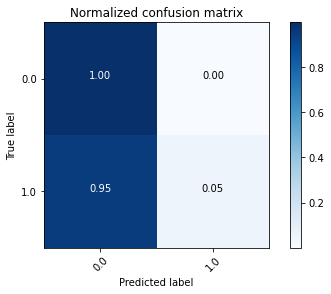

In [0]:
# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=list(class_names), normalize=True, title='Normalized confusion matrix')
plt.show()

In [0]:
from pyspark.mllib.evaluation import MulticlassMetrics

preds_and_labels = predDF.select(['prediction','label'])

metrics = MulticlassMetrics(preds_and_labels.rdd.map(tuple))

print(metrics.confusionMatrix().toArray())

/databricks/spark/python/pyspark/sql/context.py:134: FutureWarning: Deprecated in 3.0.0. Use SparkSession.builder.getOrCreate() instead.
  warnings.warn(
[[4.904e+03 4.000e+00]
 [1.500e+03 7.700e+01]]


##Measures de qualité
- **Accuracy :**  Désigne la proportion des prédictions correctes effectuées par le modèle par rapport à toutes les prédictions. Cette métrique n’indique pas les forces et faiblesses de notre modèle, sourtout avec des données inbalanced. 

$Accuracy = \frac{Nombre de prédictions corrrectes} {Nombre total de prédictions}$

$Accuracy = \frac{VP+VN} {VP+VN+FP+FN}$

- **Precision :** Quelle proportion d'identifications positives était effectivement correcte ?

$Precision = \frac{VP}{VP+FP}$

La précision permet de mesurer le coût des faux positifs, c’est-à-dire ceux détectés par erreur. Si l’on cherche à **limiter les faux positifs**, c’est cet indicateur que l’on va chercher à minimiser.


- **Recall (Rappel, sensibilité )  :** Quelle proportion de résultats positifs réels a été identifiée correctement ?

$Recall = \frac{VP}{VP+FN}$

Ce calcul permet d’estimer combien de documents réellement positifs nous avons réussi à capturer et combien sont passés au travers des mailles du filet.
Il measure l'impact des faux negatifs

- **Spécificité :** La spécificité mesure, à l’inverse que la sensibilité, la proportion d’éléments négatifs correctement identifiés.

$Spécificité = \frac{VN}{VN+FP}$

-  **F1 Score :** Le F1-Score combine subtilement la précision et le rappel. Il est intéressant et plus intéressant que l’accuracy car le nombre de vrais négatifs (VN) n’est pas pris en compte. Et dans les situations d’imbalanced class , comme c'est le cas de cet exemple, nous avons une majorité de vrais négatifs qui faussent complètement notre perception de la performance de l’algorithme. 

$F1-Score = \frac{2 * Precision * Recall}{Precision+Recall}$

**Le F1-Score est donc à privilégier sur l’accuracy dans le cas d’une situation d’imbalanced classes.**

####Threshold ou Seuil :##
 Le seuil représente la probabilité à partir de laquelle on considère que l’individu appartient à la class X.

 Imaginons un test pour détecter la grippe. Ce test se base uniquement sur la prise de température. Pour savoir si un individu est malade, on définit un seuil de température au-delà duquel l’individu est considéré malade.
Si seuil=40°C, il y a de fortes chances pour que le test fasse peu, voir aucune erreur en désignant des malades (fp=0). En revanche, il oubliera beaucoup de malades qui peuvent avoir une température de 39,5°C (fn=très élevé).

## Curve ROC

Receiver operating characteristic,  est un graphique représentant les performances d'un modèle de classification pour tous les seuils de classification. Cette courbe trace le taux de vrais positifs en fonction du taux de faux positifs :

Taux de vrais positifs
Taux de faux positifs

Cette courbe sert à deux choses 

1.   **Comparer des modèles :** Il faut se baser sur l’aire sous la courbe (Area Under the Curve). Plus l’aire sous la courbe est grande, meilleur est notre modèle.
2.   **Choisir un seuil optimal :** Le seuil idéal est le meilleur compromis entre sensibilité et spécificité. Correspond au point à la fois le plus proche de l’idéal (1,1) et à la fois le plus loin de la diagonale.
La commande `display` a une option de courbe ROC intégrée.

Pour evaluer le model nous utilisons `BinaryClassificationEvaluator` que nous permetre d'obtenior la Curve ROC et `MulticlassClassificationEvaluator` pour evaluer l'accuracy.

For more information:  
[BinaryClassificationEvaluator](https://spark.apache.org/docs/latest/api/python/reference/api/pyspark.ml.evaluation.BinaryClassificationEvaluator.html#pyspark.ml.evaluation.BinaryClassificationEvaluator.metricName)  
[MulticlassClassificationEvaluator](https://spark.apache.org/docs/latest/api/python/reference/api/pyspark.ml.evaluation.MulticlassClassificationEvaluator.html)

In [0]:
display(pipelineModel.stages[-1], predDF.drop("prediction", "rawPrediction", "probability"), "ROC")

False Positive Rate,True Positive Rate,Threshold
0.0,0.0,0.5139981510748409
0.0,0.038461538461538464,0.5139981510748409
0.0,0.07692307692307693,0.5097168835749009
0.0,0.11538461538461539,0.5001042202104626
0.0,0.15384615384615385,0.49969390423837123
0.010526315789473684,0.15384615384615385,0.49745071210263647
0.010526315789473684,0.19230769230769232,0.4908959801927014
0.010526315789473684,0.23076923076923078,0.4620901682697466
0.010526315789473684,0.2692307692307692,0.4355579611908489
0.010526315789473684,0.3076923076923077,0.431796724822335


In [0]:
from pyspark.ml.evaluation import BinaryClassificationEvaluator, MulticlassClassificationEvaluator

bcEvaluator = BinaryClassificationEvaluator(metricName="areaUnderROC")
print(f"Area under ROC curve: {bcEvaluator.evaluate(predDF)}")

mcEvaluator = MulticlassClassificationEvaluator(metricName="accuracy")
print(f"Accuracy: {mcEvaluator.evaluate(predDF)}")

mcEvaluator = MulticlassClassificationEvaluator(metricName="recallByLabel")
print(f"Recall: {mcEvaluator.evaluate(predDF)}")

Area under ROC curve: 0.8832451799218509
Accuracy: 0.7680801850424056
Recall: 0.9991850040749797


## Étape 5. Réglage des hyperparamètres

MLlib fournit des méthodes pour faciliter le réglage des hyperparamètres et la validation croisée.
- Pour le réglage des hyperparamètres, `ParamGridBuilder` vous permet de définir une recherche de grille sur un ensemble d'hyperparamètres de modèle.
- Pour la validation croisée, `CrossValidator` vous permet de spécifier un estimateur (le pipeline à appliquer à l'ensemble de données d'entrée), un évaluateur, un espace de grille d'hyperparamètres et le nombre de plis à utiliser pour la validation croisée.
  
Pour plus d'informations:
- [Sélection du modèle par validation croisée](https://spark.apache.org/docs/latest/ml-tuning.html)
- [ParamGridBuilder](https://spark.apache.org/docs/latest/api/python/pyspark.ml.html#module-pyspark.ml.tuning)
- [CrossValidator](https://spark.apache.org/docs/latest/api/python/pyspark.ml.html#pyspark.ml.tuning.CrossValidator)

Utilisez `ParamGridBuilder` et` CrossValidator` pour régler le modèle. Cet exemple utilise trois valeurs pour `regParam` et trois pour` elasticNetParam`, pour un total de 3 x 3 = 9 combinaisons d'hyperparamètres pour `CrossValidator` à examiner.

In [0]:
from pyspark.ml.tuning import ParamGridBuilder, CrossValidator

paramGrid = (ParamGridBuilder()
             .addGrid(lr.regParam, [0.01, 0.5, 2.0])
             .addGrid(lr.elasticNetParam, [0.0, 0.5, 1.0])
             .build())

Chaque fois que vous appelez `CrossValidator` dans MLlib, Databricks suit automatiquement toutes les exécutions en utilisant [MLflow](https://mlflow.org/). Vous pouvez utiliser l'interface utilisateur de MLflow 
([AWS](https://docs.databricks.com/applications/mlflow/index.html) | [Azure](https://docs.microsoft.com/azure/databricks/applications/ mlflow /)) pour comparer les performances de chaque modèle.

Dans cet exemple, nous utilisons le pipeline que nous avons créé comme estimateur

In [0]:
# Create a 3-fold CrossValidator
cv = CrossValidator(estimator=pipeline, estimatorParamMaps=paramGrid, evaluator=bcEvaluator, numFolds=3, parallelism = 4)

# Run cross validations. This step takes a few minutes and returns the best model found from the cross validation.
cvModel = cv.fit(trainDF)

## Étape 6. Faire des prédictions et évaluer les performances du modèle
Utilisez le meilleur modèle identifié par la validation croisée pour faire des prédictions sur l'ensemble de données de test, puis évaluez les performances du modèle en utilisant la zone sous la courbe ROC.

In [0]:
# Use the model identified by the cross-validation to make predictions on the test dataset
cvPredDF = cvModel.transform(testDF)

# Evaluate the model's performance based on area under the ROC curve and accuracy 
print(f"Area under ROC curve: {bcEvaluator.evaluate(cvPredDF)}")
print(f"Accuracy: {mcEvaluator.evaluate(cvPredDF)}")

Area under ROC curve: 0.9023398315950719
Accuracy: 0.9329665851670742


## Étape 7. Autres classificateurs ( À vous )
Tester les classificateurs suivantes: SVM, Radom Forest. Quel classificateur donne de meilleurs resultat en term de courve ROC et F1-Score, Recall ? Répeter le pipeline avec ces classificateurs?
Est-ce qu'on a besoin de utiliser tous les variables, trouver les variables plus rélevants, et déveloper un model avec moins de variables. 

**Rendre un document pdf avec des captures de écran et explications des meilleurs modéles et le Notebook**

- [SVM](https://spark.apache.org/docs/latest/ml-classification-regression.html#linear-support-vector-machine)
- [Radom Forest](https://spark.apache.org/docs/latest/ml-classification-regression.html#random-forest-classifier)
- [Naive Bayes](https://spark.apache.org/docs/latest/ml-classification-regression.html#naive-bayes)

## SVM

##Divisez les données de manière aléatoire en ensembles d'apprentissage et de test, et définissez des semences pour la reproductibilité.

In [0]:
trainDF_svm, testDF_svm = dataset.randomSplit([0.8, 0.2], seed=42)

## Définir le modèle d'apprentisage

In [0]:
from pyspark.ml.classification import LinearSVC

lsvc = LinearSVC(featuresCol="features", labelCol="label", regParam=1.0)


## Construisez le pipeline

In [0]:
# Define the pipeline based on the stages created in previous steps.
pipeline = Pipeline(stages=[stringIndexer, encoder, labelToIndex, vecAssembler, lsvc])

In [0]:
# Define the pipeline model.
pipelineModel = pipeline.fit(trainDF_svm)

# Apply the pipeline model to the test dataset.
predDF_svm = pipelineModel.transform(testDF_svm)
display(predDF_svm)

age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income,workclassIndex,educationIndex,marital_statusIndex,occupationIndex,relationshipIndex,raceIndex,sexIndex,workclassOHE,educationOHE,marital_statusOHE,occupationOHE,relationshipOHE,raceOHE,sexOHE,label,features,rawPrediction,prediction
17.0,?,41643.0,11th,7.0,Never-married,?,Own-child,White,Female,0.0,0.0,15.0,United-States,<=50K,3.0,5.0,1.0,7.0,2.0,0.0,1.0,"Map(vectorType -> sparse, length -> 8, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 15, indices -> List(5), values -> List(1.0))","Map(vectorType -> sparse, length -> 6, indices -> List(1), values -> List(1.0))","Map(vectorType -> sparse, length -> 14, indices -> List(7), values -> List(1.0))","Map(vectorType -> sparse, length -> 5, indices -> List(2), values -> List(1.0))","Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 1, indices -> List(), values -> List())",0.0,"Map(vectorType -> sparse, length -> 59, indices -> List(3, 13, 24, 36, 45, 48, 53, 54, 55, 58), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 17.0, 41643.0, 7.0, 15.0))","Map(vectorType -> dense, length -> 2, values -> List(1.5257753799188973, -1.5257753799188973))",0.0
17.0,?,64785.0,10th,6.0,Never-married,?,Own-child,White,Male,0.0,0.0,30.0,United-States,<=50K,3.0,7.0,1.0,7.0,2.0,0.0,0.0,"Map(vectorType -> sparse, length -> 8, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 15, indices -> List(7), values -> List(1.0))","Map(vectorType -> sparse, length -> 6, indices -> List(1), values -> List(1.0))","Map(vectorType -> sparse, length -> 14, indices -> List(7), values -> List(1.0))","Map(vectorType -> sparse, length -> 5, indices -> List(2), values -> List(1.0))","Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 1, indices -> List(0), values -> List(1.0))",0.0,"Map(vectorType -> sparse, length -> 59, indices -> List(3, 15, 24, 36, 45, 48, 52, 53, 54, 55, 58), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 17.0, 64785.0, 6.0, 30.0))","Map(vectorType -> dense, length -> 2, values -> List(1.4522121043677227, -1.4522121043677227))",0.0
17.0,?,80077.0,11th,7.0,Never-married,?,Own-child,White,Female,0.0,0.0,20.0,United-States,<=50K,3.0,5.0,1.0,7.0,2.0,0.0,1.0,"Map(vectorType -> sparse, length -> 8, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 15, indices -> List(5), values -> List(1.0))","Map(vectorType -> sparse, length -> 6, indices -> List(1), values -> List(1.0))","Map(vectorType -> sparse, length -> 14, indices -> List(7), values -> List(1.0))","Map(vectorType -> sparse, length -> 5, indices -> List(2), values -> List(1.0))","Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 1, indices -> List(), values -> List())",0.0,"Map(vectorType -> sparse, length -> 59, indices -> List(3, 13, 24, 36, 45, 48, 53, 54, 55, 58), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 17.0, 80077.0, 7.0, 20.0))","Map(vectorType -> dense, length -> 2, values -> List(1.5092109057147614, -1.5092109057147614))",0.0
17.0,?,104025.0,11th,7.0,Never-married,?,Own-child,White,Male,0.0,0.0,18.0,United-States,<=50K,3.0,5.0,1.0,7.0,2.0,0.0,0.0,"Map(vectorType -> sparse, length -> 8, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 15, indices -> List(5), values -> List(1.0))","Map(vectorType -> sparse, length -> 6, indices -> List(1), values -> List(1.0))","Map(vectorType -> sparse, length -> 14, indices -> List(7), values -> List(1.0))","Map(vectorType -> sparse, length -> 5, indices -> List(2), values -> List(1.0))","Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 1, indices -> List(0), values -> L

In [0]:
class_temp = predDF.select("label").groupBy("label")\
                        .count().sort('count', ascending=False).toPandas()
class_temp = class_temp["label"].values.tolist()
class_names = list(map(str, class_temp))

In [0]:
y_true = predDF_svm.select("label")
y_true = y_true.toPandas()

y_pred = predDF_svm.select("prediction")
y_pred = y_pred.toPandas()

cnf_matrix = confusion_matrix(y_true, y_pred)

Normalized confusion matrix
[[9.99592502e-01 4.07497963e-04]
 [9.53075460e-01 4.69245403e-02]]


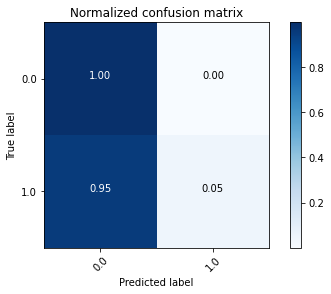

In [0]:
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=list(class_names), normalize=True, title='Normalized confusion matrix')
plt.show()

##Measures de qualité

In [0]:
from pyspark.ml.evaluation import BinaryClassificationEvaluator, MulticlassClassificationEvaluator

bcEvaluator = BinaryClassificationEvaluator(metricName="areaUnderROC")
print(f"Area under ROC curve: {bcEvaluator.evaluate(predDF_svm)}")

mcEvaluator = MulticlassClassificationEvaluator(metricName="accuracy")
print(f"Accuracy: {mcEvaluator.evaluate(predDF_svm)}")

mcEvaluator = MulticlassClassificationEvaluator(metricName="recallByLabel")
print(f"Recall: {mcEvaluator.evaluate(predDF_svm)}")

Area under ROC curve: 0.8847881553236456
Accuracy: 0.7679259830377795
Recall: 0.9995925020374898


## Réglage des hyperparamètres

In [0]:
from pyspark.ml.tuning import ParamGridBuilder, CrossValidator
paramGrid = (ParamGridBuilder()
             .addGrid(lsvc.maxIter, [10, 100, 1000])
             .addGrid(lsvc.regParam, [0.01,0.1,1.0,10.0,100.0])
             .addGrid(lsvc.aggregationDepth, [30,60])
             .build())

In [0]:
# Create a 3-fold CrossValidator
cv = CrossValidator(estimator=pipeline, estimatorParamMaps=paramGrid, evaluator=bcEvaluator, numFolds=3, parallelism = 4)

# Run cross validations. This step takes a few minutes and returns the best model found from the cross validation.
cvModel = cv.fit(trainDF_svm)

In [0]:
# Use the model identified by the cross-validation to make predictions on the test dataset
cvPredDF = cvModel.transform(testDF_svm)

# Evaluate the model's performance based on area under the ROC curve and accuracy 
print(f"Area under ROC curve: {bcEvaluator.evaluate(cvPredDF)}")
print(f"Accuracy: {mcEvaluator.evaluate(cvPredDF)}")

Area under ROC curve: 0.9001913586659108
Accuracy: 0.9366340668296659


In [0]:
def find_best_dataset (dataset, column, model) : 
  dataset = dataset.drop(column)
  categoricalCols = ["workclass", "education", "marital_status", "occupation", "relationship", "race", "sex"]
  numericCols = ["age", "fnlwgt", "education_num", "capital_gain", "capital_loss", "hours_per_week"]
  if  column in categoricalCols :
    categoricalCols.remove(column)
  if column in numericCols : 
    numericCols.remove(column)
  stringIndexer = StringIndexer(inputCols=categoricalCols, outputCols=[x + "Index" for x in categoricalCols]) 
  encoder = OneHotEncoder(inputCols=stringIndexer.getOutputCols(), outputCols=[x + "OHE" for x in categoricalCols]) 
  labelToIndex = StringIndexer(inputCol="income", outputCol="label")
  assemblerInputs = [c + "OHE" for c in categoricalCols] + numericCols
  vecAssembler = VectorAssembler(inputCols=assemblerInputs, outputCol="features")
  trainDF, testDF = dataset.randomSplit([0.8, 0.2], seed=42)
  
  # Define the pipeline based on the stages created in previous steps.
  pipeline = Pipeline(stages=[stringIndexer, encoder, labelToIndex, vecAssembler, model])
  
  # Define the pipeline model.
  pipelineModel = pipeline.fit(trainDF)
  predDF = pipelineModel.transform(testDF)
  
  bcEvaluator = BinaryClassificationEvaluator(metricName="areaUnderROC")
  roc_curve = bcEvaluator.evaluate(predDF)
  
  mcEvaluator = MulticlassClassificationEvaluator(metricName="accuracy")
  accuracy = mcEvaluator.evaluate(predDF)
  return roc_curve, accuracy

In [0]:
lsvc = LinearSVC(featuresCol="features", labelCol="label", regParam=1.0)
list_roc_curve = []
liste_accuracy = [] 
for column in dataset.columns:
  print(column)
  if (column != 'income') : 
    roc_curve, accuracy = find_best_dataset(dataset, column, lsvc )
    list_roc_curve.append(roc_curve)
    liste_accuracy.append(accuracy)

age
workclass
fnlwgt
education
education_num
marital_status
occupation
relationship
race
sex
capital_gain
capital_loss
hours_per_week
native_country
income


Out[51]: Text(0, 0.5, 'score')

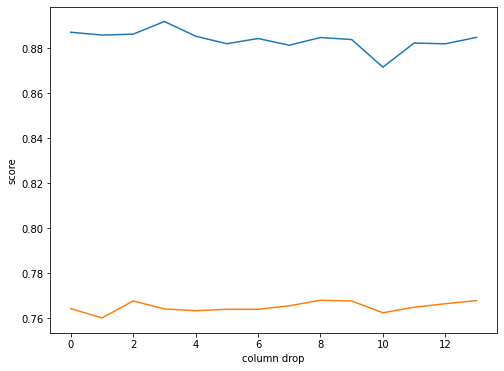

In [0]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(1,1, figsize =(8,6))
ax.plot(range(0,len(dataset.columns)-1),list_roc_curve)
ax.plot(range(0,len(dataset.columns)-1),liste_accuracy)
ax.set_xlabel('column drop')
ax.set_ylabel('score')

# Random Forest

##Divisez les données de manière aléatoire en ensembles d'apprentissage et de test, et définissez des semences pour la reproductibilité.

In [0]:
train_rf_DF, test_rf_DF = dataset.randomSplit([0.8, 0.2], seed=42)

## Définir le modèle d'apprentisage

In [0]:
from pyspark.ml.classification import RandomForestClassifier
rf = RandomForestClassifier(labelCol="label", featuresCol="features")

## Construisez le pipeline

In [0]:
# Define the pipeline based on the stages created in previous steps.
pipeline = Pipeline(stages=[stringIndexer, encoder, labelToIndex, vecAssembler, rf])

In [0]:
# Define the pipeline model.
pipelineModel = pipeline.fit(train_rf_DF)

# Apply the pipeline model to the test dataset.
pred_rf_DF = pipelineModel.transform(test_rf_DF)
display(pred_rf_DF)

age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income,workclassIndex,educationIndex,marital_statusIndex,occupationIndex,relationshipIndex,raceIndex,sexIndex,workclassOHE,educationOHE,marital_statusOHE,occupationOHE,relationshipOHE,raceOHE,sexOHE,label,features,rawPrediction,probability,prediction
17.0,?,41643.0,11th,7.0,Never-married,?,Own-child,White,Female,0.0,0.0,15.0,United-States,<=50K,3.0,5.0,1.0,7.0,2.0,0.0,1.0,"Map(vectorType -> sparse, length -> 8, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 15, indices -> List(5), values -> List(1.0))","Map(vectorType -> sparse, length -> 6, indices -> List(1), values -> List(1.0))","Map(vectorType -> sparse, length -> 14, indices -> List(7), values -> List(1.0))","Map(vectorType -> sparse, length -> 5, indices -> List(2), values -> List(1.0))","Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 1, indices -> List(), values -> List())",0.0,"Map(vectorType -> sparse, length -> 59, indices -> List(3, 13, 24, 36, 45, 48, 53, 54, 55, 58), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 17.0, 41643.0, 7.0, 15.0))","Map(vectorType -> dense, length -> 2, values -> List(19.089218655708656, 0.9107813442913464))","Map(vectorType -> dense, length -> 2, values -> List(0.9544609327854326, 0.04553906721456731))",0.0
17.0,?,64785.0,10th,6.0,Never-married,?,Own-child,White,Male,0.0,0.0,30.0,United-States,<=50K,3.0,7.0,1.0,7.0,2.0,0.0,0.0,"Map(vectorType -> sparse, length -> 8, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 15, indices -> List(7), values -> List(1.0))","Map(vectorType -> sparse, length -> 6, indices -> List(1), values -> List(1.0))","Map(vectorType -> sparse, length -> 14, indices -> List(7), values -> List(1.0))","Map(vectorType -> sparse, length -> 5, indices -> List(2), values -> List(1.0))","Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 1, indices -> List(0), values -> List(1.0))",0.0,"Map(vectorType -> sparse, length -> 59, indices -> List(3, 15, 24, 36, 45, 48, 52, 53, 54, 55, 58), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 17.0, 64785.0, 6.0, 30.0))","Map(vectorType -> dense, length -> 2, values -> List(18.856144853200632, 1.14385514679937))","Map(vectorType -> dense, length -> 2, values -> List(0.9428072426600315, 0.057192757339968495))",0.0
17.0,?,80077.0,11th,7.0,Never-married,?,Own-child,White,Female,0.0,0.0,20.0,United-States,<=50K,3.0,5.0,1.0,7.0,2.0,0.0,1.0,"Map(vectorType -> sparse, length -> 8, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 15, indices -> List(5), values -> List(1.0))","Map(vectorType -> sparse, length -> 6, indices -> List(1), values -> List(1.0))","Map(vectorType -> sparse, length -> 14, indices -> List(7), values -> List(1.0))","Map(vectorType -> sparse, length -> 5, indices -> List(2), values -> List(1.0))","Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 1, indices -> List(), values -> List())",0.0,"Map(vectorType -> sparse, length -> 59, indices -> List(3, 13, 24, 36, 45, 48, 53, 54, 55, 58), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 17.0, 80077.0, 7.0, 20.0))","Map(vectorType -> dense, length -> 2, values -> List(19.089218655708656, 0.9107813442913464))","Map(vectorType -> dense, length -> 2, values -> List(0.9544609327854326, 0.04553906721456731))",0.0
17.0,?,104025.0,11th,7.0,Never-married,?,Own-child,White,Male,0.0,0.0,18.0,United-States,<=50K,3.0,5.0,1.0,7.0,2.0,0.0,0.0,"Map(vectorType -> sparse, length -> 8, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 15, indices -> List(5), values -> List(1.0))","Map(vectorType -> sparse, length -> 6, indices -> List(1), values -> List(1.0))","Map(vectorType -> 

In [0]:
class_temp = pred_rf_DF.select("label").groupBy("label")\
                        .count().sort('count', ascending=False).toPandas()
class_temp = class_temp["label"].values.tolist()
class_names = list(map(str, class_temp))

In [0]:
y_true = pred_rf_DF.select("label")
y_true = y_true.toPandas()

y_pred = pred_rf_DF.select("prediction")
y_pred = y_pred.toPandas()

cnf_matrix = confusion_matrix(y_true, y_pred)

Normalized confusion matrix
[[0.9692339  0.0307661 ]
 [0.60114141 0.39885859]]


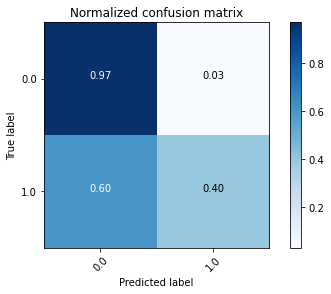

In [0]:
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=list(class_names), normalize=True, title='Normalized confusion matrix')
plt.show()

In [0]:
from pyspark.ml.evaluation import BinaryClassificationEvaluator, MulticlassClassificationEvaluator

bcEvaluator = BinaryClassificationEvaluator(metricName="areaUnderROC")
print(f"Area under ROC curve: {bcEvaluator.evaluate(pred_rf_DF)}")

mcEvaluator = MulticlassClassificationEvaluator(metricName="accuracy")
print(f"Accuracy: {mcEvaluator.evaluate(pred_rf_DF)}")

mcEvaluator = MulticlassClassificationEvaluator(metricName="recallByLabel")
print(f"Recall: {mcEvaluator.evaluate(pred_rf_DF)}")

Area under ROC curve: 0.8901881493287529
Accuracy: 0.8305319969159599
Recall: 0.9692339038304808


In [0]:
from pyspark.ml.tuning import ParamGridBuilder, CrossValidator
paramGrid = (ParamGridBuilder()
             .addGrid(rf.numTrees, [1, 10, 25,50, 75, 100])
             .addGrid(rf.maxDepth, [1, 10, 25])
             .addGrid(rf.maxBins, [10, 25,50, 75, 100])
             .build())

In [0]:
# Create a 3-fold CrossValidator
cv = CrossValidator(estimator=pipeline, estimatorParamMaps=paramGrid, evaluator=bcEvaluator, numFolds=3, parallelism = 4)

# Run cross validations. This step takes a few minutes and returns the best model found from the cross validation.
cvModel = cv.fit(train_rf_DF)

In [0]:
# Use the model identified by the cross-validation to make predictions on the test dataset
cvPredDF = cvModel.transform(test_rf_DF)

# Evaluate the model's performance based on area under the ROC curve and accuracy 
print(f"Area under ROC curve: {bcEvaluator.evaluate(cvPredDF)}")
print(f"Accuracy: {mcEvaluator.evaluate(cvPredDF)}")

Area under ROC curve: 0.9001913586659108
Accuracy: 0.9366340668296659


In [0]:
rf = RandomForestClassifier(labelCol="label", featuresCol="features")
list_roc_curve = []
liste_accuracy = [] 
for column in dataset.columns:
  if (column != 'income') : 
    roc_curve, accuracy = find_best_dataset(dataset, column, rf )
    list_roc_curve.append(roc_curve)
    liste_accuracy.append(accuracy)

age
workclass
fnlwgt
education
education_num
marital_status
occupation
relationship
race
sex
capital_gain
capital_loss
hours_per_week
native_country
income


Out[66]: Text(0, 0.5, 'score')

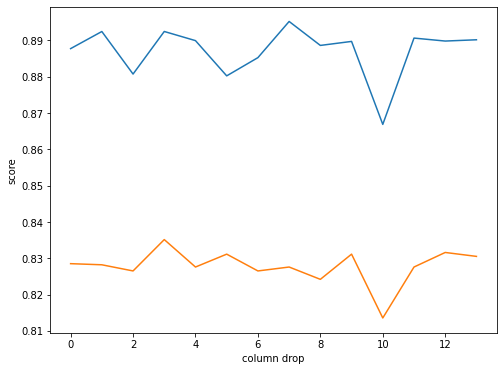

In [0]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(1,1, figsize =(8,6))
ax.plot(range(0,len(dataset.columns)-1),list_roc_curve)
ax.plot(range(0,len(dataset.columns)-1),liste_accuracy)
ax.set_xlabel('column drop')
ax.set_ylabel('score')

## Naive Bayes

In [0]:
train_nb_DF, test_nb_DF = dataset.randomSplit([0.8, 0.2], seed=42)

In [0]:
from pyspark.ml.classification import NaiveBayes
nb = NaiveBayes( featuresCol='features', labelCol='label')

## Construisez le pipeline

In [0]:
# Define the pipeline based on the stages created in previous steps.
pipeline = Pipeline(stages=[stringIndexer, encoder, labelToIndex, vecAssembler, nb])

In [0]:
# Define the pipeline model.
pipelineModel = pipeline.fit(train_nb_DF)

# Apply the pipeline model to the test dataset.
pred_nb_DF = pipelineModel.transform(test_nb_DF)
display(pred_nb_DF)

age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income,workclassIndex,educationIndex,marital_statusIndex,occupationIndex,relationshipIndex,raceIndex,sexIndex,workclassOHE,educationOHE,marital_statusOHE,occupationOHE,relationshipOHE,raceOHE,sexOHE,label,features,rawPrediction,probability,prediction
17.0,?,41643.0,11th,7.0,Never-married,?,Own-child,White,Female,0.0,0.0,15.0,United-States,<=50K,3.0,5.0,1.0,7.0,2.0,0.0,1.0,"Map(vectorType -> sparse, length -> 8, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 15, indices -> List(5), values -> List(1.0))","Map(vectorType -> sparse, length -> 6, indices -> List(1), values -> List(1.0))","Map(vectorType -> sparse, length -> 14, indices -> List(7), values -> List(1.0))","Map(vectorType -> sparse, length -> 5, indices -> List(2), values -> List(1.0))","Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 1, indices -> List(), values -> List())",0.0,"Map(vectorType -> sparse, length -> 59, indices -> List(3, 13, 24, 36, 45, 48, 53, 54, 55, 58), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 17.0, 41643.0, 7.0, 15.0))","Map(vectorType -> dense, length -> 2, values -> List(-490.7324002444633, -1360.4208326113965))","Map(vectorType -> dense, length -> 2, values -> List(1.0, 0.0))",0.0
17.0,?,64785.0,10th,6.0,Never-married,?,Own-child,White,Male,0.0,0.0,30.0,United-States,<=50K,3.0,7.0,1.0,7.0,2.0,0.0,0.0,"Map(vectorType -> sparse, length -> 8, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 15, indices -> List(7), values -> List(1.0))","Map(vectorType -> sparse, length -> 6, indices -> List(1), values -> List(1.0))","Map(vectorType -> sparse, length -> 14, indices -> List(7), values -> List(1.0))","Map(vectorType -> sparse, length -> 5, indices -> List(2), values -> List(1.0))","Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 1, indices -> List(0), values -> List(1.0))",0.0,"Map(vectorType -> sparse, length -> 59, indices -> List(3, 15, 24, 36, 45, 48, 52, 53, 54, 55, 58), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 17.0, 64785.0, 6.0, 30.0))","Map(vectorType -> dense, length -> 2, values -> List(-656.9071366904166, -2005.3659098657736))","Map(vectorType -> dense, length -> 2, values -> List(1.0, 0.0))",0.0
17.0,?,80077.0,11th,7.0,Never-married,?,Own-child,White,Female,0.0,0.0,20.0,United-States,<=50K,3.0,5.0,1.0,7.0,2.0,0.0,1.0,"Map(vectorType -> sparse, length -> 8, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 15, indices -> List(5), values -> List(1.0))","Map(vectorType -> sparse, length -> 6, indices -> List(1), values -> List(1.0))","Map(vectorType -> sparse, length -> 14, indices -> List(7), values -> List(1.0))","Map(vectorType -> sparse, length -> 5, indices -> List(2), values -> List(1.0))","Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 1, indices -> List(), values -> List())",0.0,"Map(vectorType -> sparse, length -> 59, indices -> List(3, 13, 24, 36, 45, 48, 53, 54, 55, 58), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 17.0, 80077.0, 7.0, 20.0))","Map(vectorType -> dense, length -> 2, values -> List(-592.4907411177153, -2260.897715285663))","Map(vectorType -> dense, length -> 2, values -> List(1.0, 0.0))",0.0
17.0,?,104025.0,11th,7.0,Never-married,?,Own-child,White,Male,0.0,0.0,18.0,United-States,<=50K,3.0,5.0,1.0,7.0,2.0,0.0,0.0,"Map(vectorType -> sparse, length -> 8, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 15, indices -> List(5), values -> List(1.0))","Map(vectorType -> sparse, length -> 6, indices -> List(1), values -> List(1.0))","Map(vectorType -> sparse, length -> 14, indices -> List(7), values -> List(1.0))","Map(vectorType -> sparse,

In [0]:
class_temp = pred_nb_DF.select("label").groupBy("label")\
                        .count().sort('count', ascending=False).toPandas()
class_temp = class_temp["label"].values.tolist()
class_names = list(map(str, class_temp))

In [0]:
y_true = pred_nb_DF.select("label")
y_true = y_true.toPandas()

y_pred = pred_nb_DF.select("prediction")
y_pred = y_pred.toPandas()

cnf_matrix = confusion_matrix(y_true, y_pred)

Normalized confusion matrix
[[0.95537897 0.04462103]
 [0.75079264 0.24920736]]


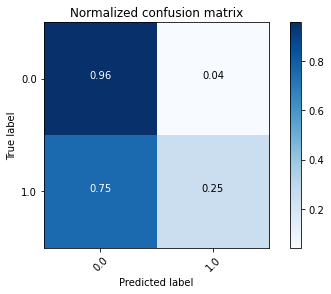

In [0]:
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=list(class_names), normalize=True, title='Normalized confusion matrix')
plt.show()

In [0]:
from pyspark.ml.evaluation import BinaryClassificationEvaluator, MulticlassClassificationEvaluator

bcEvaluator = BinaryClassificationEvaluator(metricName="areaUnderROC")
print(f"Area under ROC curve: {bcEvaluator.evaluate(pred_nb_DF)}")

mcEvaluator = MulticlassClassificationEvaluator(metricName="accuracy")
print(f"Accuracy: {mcEvaluator.evaluate(pred_nb_DF)}")

mcEvaluator = MulticlassClassificationEvaluator(metricName="recallByLabel")
print(f"Recall: {mcEvaluator.evaluate(pred_nb_DF)}")

Area under ROC curve: 0.3584528565943093
Accuracy: 0.7836545875096377
Recall: 0.9553789731051344


In [0]:
from pyspark.ml.tuning import ParamGridBuilder, CrossValidator
paramGrid = (ParamGridBuilder()
             .addGrid(nb.smoothing, [0.0, 0.2, 0.4, 0.6, 0.8, 1.0, 1.5, 2.0])
             .build())

In [0]:
# Create a 3-fold CrossValidator
cv = CrossValidator(estimator=pipeline, estimatorParamMaps=paramGrid, evaluator=bcEvaluator, numFolds=3, parallelism = 4)

# Run cross validations. This step takes a few minutes and returns the best model found from the cross validation.
cvModel = cv.fit(train_nb_DF)

In [0]:
# Use the model identified by the cross-validation to make predictions on the test dataset
cvPredDF = cvModel.transform(test_nb_DF)

# Evaluate the model's performance based on area under the ROC curve and accuracy 
print(f"Area under ROC curve: {bcEvaluator.evaluate(cvPredDF)}")
print(f"Accuracy: {mcEvaluator.evaluate(cvPredDF)}")

Area under ROC curve: 0.36274644324305333
Accuracy: 0.9557864710676447


In [0]:
nb = NaiveBayes( featuresCol='features', labelCol='label')
list_roc_curve = []
liste_accuracy = [] 
for column in dataset.columns:
  if (column != 'income') : 
    roc_curve, accuracy = find_best_dataset(dataset, column, nb )
    list_roc_curve.append(roc_curve)
    liste_accuracy.append(accuracy)

Out[79]: Text(0, 0.5, 'score')

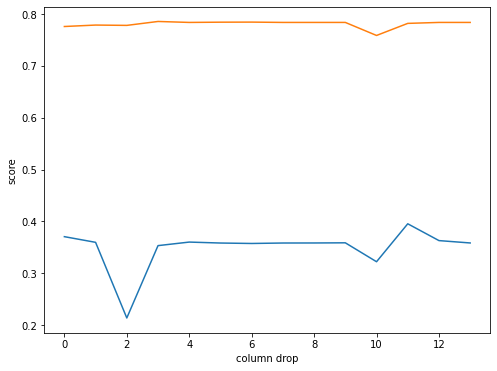

In [0]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(1,1, figsize =(8,6))
ax.plot(range(0,len(dataset.columns)-1),list_roc_curve)
ax.plot(range(0,len(dataset.columns)-1),liste_accuracy)
ax.set_xlabel('column drop')
ax.set_ylabel('score')

In [0]:
print(list_roc_curve,liste_accuracy)

[0.37060205044805417, 0.35967507179454317, 0.21383206850684217, 0.3533221258673048, 0.3601597872638413, 0.3583225580225937, 0.35747508202586553, 0.35835363071123777, 0.35843890295450254, 0.35874381582435766, 0.32226975612036596, 0.39543110028584283, 0.3630205418250019, 0.3584528565943093] [0.7757902852737085, 0.7785659213569777, 0.7779491133384734, 0.7855050115651504, 0.7836545875096377, 0.7841171935235158, 0.7842713955281418, 0.7836545875096377, 0.7836545875096377, 0.7836545875096377, 0.7585196607555899, 0.781804163454125, 0.7836545875096377, 0.7836545875096377]
